# Chapter 7: Spatial Models

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1">Introduction</a></span></li><li><span><a href="#Environment-Preparation" data-toc-modified-id="Environment-Preparation-2">Environment Preparation</a></span></li><li><span><a href="#Program-7.1:-SIR-metapopulation-model-for-animals" data-toc-modified-id="Program-7.1:-SIR-metapopulation-model-for-animals-3">Program 7.1: SIR metapopulation model for animals</a></span></li><li><span><a href="#Program-7.2:-SIR-metapopulation-model-for--humans" data-toc-modified-id="Program-7.2:-SIR-metapopulation-model-for--humans-4">Program 7.2: SIR metapopulation model for  humans</a></span></li><li><span><a href="#Program-7:3:-Coupled-lattice-model-with-commuter-like-coupling" data-toc-modified-id="Program-7:3:-Coupled-lattice-model-with-commuter-like-coupling-5">Program 7:3: Coupled lattice model with commuter-like coupling</a></span></li><li><span><a href="#Program-7.4:-Forest-fire-model" data-toc-modified-id="Program-7.4:-Forest-fire-model-6">Program 7.4: Forest fire model</a></span></li><li><span><a href="#Program-7.8:-Pairwise-SIS-approximation-model" data-toc-modified-id="Program-7.8:-Pairwise-SIS-approximation-model-7">Program 7.8: Pairwise SIS approximation model</a></span></li></ul></div>

## Introduction

Chapter 7 discusses spatial transmission, geographical proximity, level of interaction and movement. Generally, models of this sort operate by partitioning the population according to the spatial position of hosts, such that nearby hosts are grouped together and interact more strongly. Please note that not all models of this chapter have been coded, but the online material of the book may be a resource for the ones missing. It may be that some of them may be coded in the future, but there are no immediate plans for now. On purpose a random seed was not added, so the reader can see the effect of stochasticity straight of out the models. For more details please refer back to the book (http://modelinginfectiousdiseases.org/).

## Environment Preparation

In [6]:
import scipy.integrate as spi
import numpy as np
import pylab as pl
import time, os
from IPython.display import Video
from tqdm.notebook import tqdm

In [7]:
pl.style.use('seaborn-whitegrid')
pl.rcParams['font.family'] = "sans-serif"

## Program 7.1: SIR metapopulation model for animals

[[1.00000000e-01 1.00000000e-01 1.00000000e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [1.00080032e-01 1.00089986e-01 1.00089986e-01 ... 9.97487007e-08
  9.97487007e-08 9.97487007e-08]
 [1.00160128e-01 1.00179942e-01 1.00179942e-01 ... 1.99005302e-07
  1.99005302e-07 1.99005302e-07]
 ...
 [1.01229117e-01 1.01229111e-01 1.01229111e-01 ... 4.63859637e-04
  4.63859637e-04 4.63859637e-04]
 [1.01272000e-01 1.01271994e-01 1.01271994e-01 ... 4.64393536e-04
  4.64393536e-04 4.64393536e-04]
 [1.01314803e-01 1.01314797e-01 1.01314797e-01 ... 4.64947973e-04
  4.64947973e-04 4.64947973e-04]]


Text(0.5, 0, 'Time (Years)')

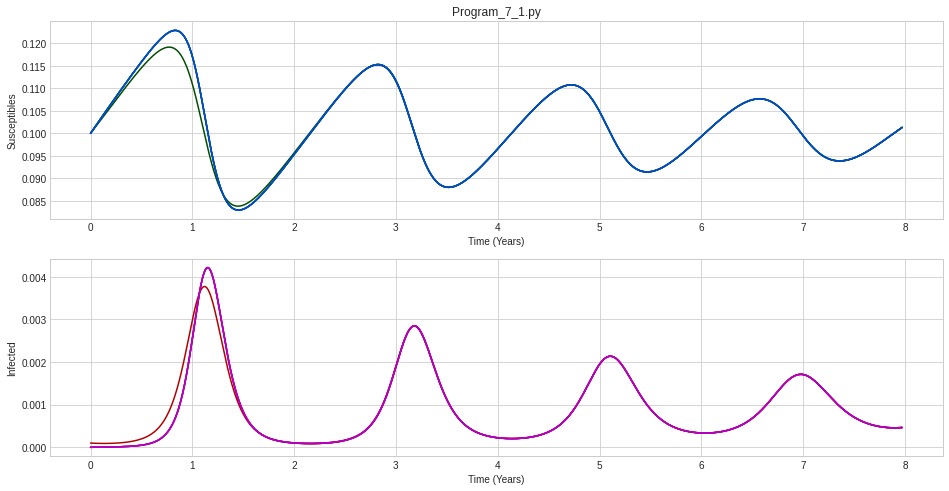

In [8]:
# Parameters
n=5;
beta=1.0*np.ones(n);
gamma=0.1*np.ones(n);
nu=0.0001*np.ones(n);
mu=0.0001*np.ones(n);
X0=0.1*np.ones(n);
Y0=0.0*np.ones(n); Y0[0]=0.0001;
m=0.001*np.ones((n,n)); m=m-np.diag(np.diag(m));
ND=MaxTime=2910.0;
TS=1.0

INPUT=np.hstack((X0,Y0))

# Model Definition
def diff_eqs(INP,t):
	'''The main set of equations'''
	Y=np.zeros((2*n))
	V = INP
	for i in range(n):
		Y[i] = nu[i] - beta[i]*V[i]*V[n+i] - mu[i]*V[i];
		Y[n+i] = beta[i]*V[i]*V[n+i] - mu[i]*V[n+i] - gamma[i]*V[n+i]
		for j in range(n):
			Y[i]+=m[i][j]*V[j] - m[j][i]*V[i];
			Y[n+i]+=m[i][j]*V[n+j] - m[j][i]*V[n+i];
	return Y   # For odeint

# Model Run
t_start = 0.0; t_end = ND; t_inc = TS
t_range = np.arange(t_start, t_end+t_inc, t_inc)
RES = spi.odeint(diff_eqs,INPUT,t_range)

# PRint Results
print (RES)

#Ploting
pl.figure(figsize=(16, 8))
pl.subplot(211)
for i in range(n):
	pl.plot(t_range/365.0, RES[:,i], color=(0.0,0.3,i/5))
pl.xlabel('Time (Years)')
pl.ylabel('Susceptibles')
pl.title("Program_7_1.py")
pl.subplot(212)
for i in range(n):
	pl.plot(t_range/365.0, RES[:,i+n], color=(0.7,0.0,i/5))
pl.ylabel('Infected')
pl.xlabel('Time (Years)')

## Program 7.2: SIR metapopulation model for  humans

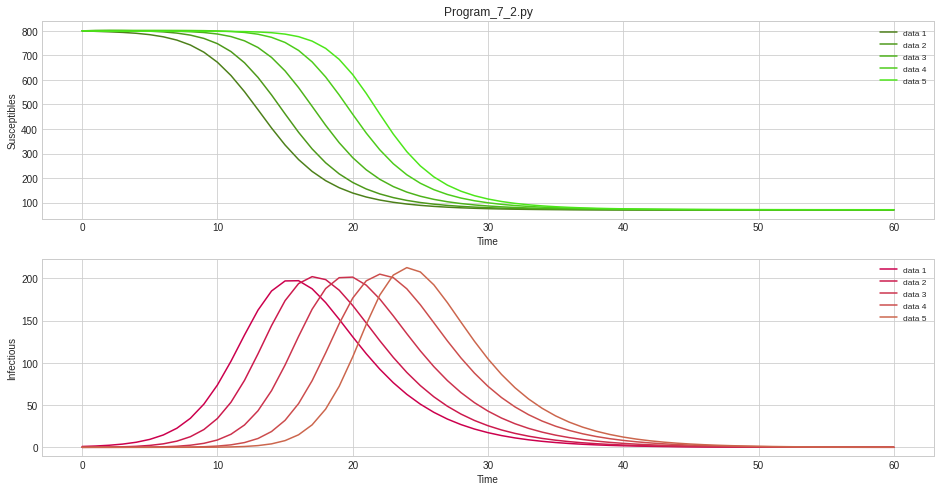

In [9]:
# Environment Preparation
import scipy.integrate as spi
import numpy as np
import pylab as pl
from matplotlib.font_manager import FontProperties as fmp

# Parameters
n=5
beta=1.0*np.ones(n);
gamma=0.3*np.ones(n);
N0=np.zeros(n*n);
X0=np.zeros(n*n);
for i in np.arange(0,n*n,n+1):
	N0[i]=1000.0
	X0[i]=800.0

Y0=np.zeros(n*n); Y0[0]=1.0;
ND=MaxTime=60.
TS=1.0

l=np.zeros((n,n));r=np.zeros((n,n))
for i in range(n):
	for j in range(n):
		if abs(i-j)==1:
			l[i][j]=0.1
r=2*np.ones((n,n)); r=r-np.diag(np.diag(r));

INPUT0=np.hstack((X0,Y0,N0))
INPUT = np.zeros((3*n*n))
for i in range(n*n):
	INPUT[3*i]=INPUT0[i]
	INPUT[1+3*i]=INPUT0[n*n+i]
	INPUT[2+3*i]=INPUT0[2*n*n+i]

# Model Definition
def diff_eqs(INP,t):
	'''The main set of equations'''
	Y=np.zeros((3*n*n))
	V = INP
	sumY=np.zeros(n)
	sumN=np.zeros(n)

	## Calculate number currently in Subpopulation i
	for i in range(n):
		sumY[i]=0.0;sumN[i]=0.0
		for j in range(n):
			k=3*(j+i*n);
			sumN[i]+=V[2+k];
			sumY[i]+=V[1+k];

	## Set all rates to zeros
	for i in range(n):
		for j in range(n):
			k=3*(j+i*n);
			Y[k]=0; Y[1+k]=0; Y[2+k]=0

	for i in range(n):
		for j in range(n):
			## Calculate the rates
			k = 3 * (j+i*n)
			K = 3 * (i+j*n)
			h = 3 * (i+i*n)
			H = 3 * (j+j*n)

			Y[k] -= (beta[i]*V[k]*(sumY[i]/sumN[i]))
			Y[k+1] += (beta[i]*V[k]*(sumY[i]/sumN[i]))
			Y[k+1] -= (gamma[i]*V[k+1])

			## Movement
			Y[h] += r[j][i]*V[K]
			Y[h] -= l[j][i]*V[h]

			Y[h+1] += r[j][i]*V[K+1]
			Y[h+1] -= l[j][i]*V[h+1]

			Y[h+2] += r[j][i]*V[K+2]
			Y[h+2] -= l[j][i]*V[h+2]

			Y[k] += l[i][j]*V[H]
			Y[k] -= r[i][j]*V[k]

			Y[1+k] += l[i][j]*V[1+H]
			Y[1+k] -= r[i][j]*V[1+k]

			Y[2+k] += l[i][j]*V[2+H]
			Y[2+k] -= r[i][j]*V[2+k]
	return Y   # For odeint

# Model Run
t_start = 0.0; t_end = ND; t_inc = TS
t_range = np.arange(t_start, t_end+t_inc, t_inc)
t_course = spi.odeint(diff_eqs,INPUT,t_range)
tc = t_course

### Plotting
pl.figure(figsize=(16, 8))
totalS=np.zeros((len(tc),5))
totalI=np.zeros((len(tc),5))

for i in range(n):
	for j in range(n):
		k=3*(j+i*n);
		totalS[:,i]+=tc[:,k]
		totalI[:,i]+=tc[:,k+1]


#print len(totalS)
pl.subplot(211)
for i in range(5):
	pl.plot(t_range,totalS[:,i], label=('data %s' %(i+1)), color=(0.3,i/10.+0.5,0.1))
pl.xlabel('Time')
pl.ylabel('Susceptibles')
pl.legend(loc=1,prop = fmp(size='smaller'))
pl.title("Program_7_2.py")
pl.subplot(212)
for i in range(5):
	pl.plot(t_range,totalI[:,i], label=('data %s' %(i+1)), color=(0.8,i/10.+0.,0.3))
pl.xlabel('Time')
pl.ylabel('Infectious')
pl.legend(loc=1,prop = fmp(size='smaller'))

## Program 7:3: Coupled lattice model with commuter-like coupling

/tmp/ipykernel_3914/491597678.py:83: DeprecationWarning: Converting `np.integer` or `np.signedinteger` to a dtype is deprecated. The current result is `np.dtype(np.int_)` which is not strictly correct. Note that the result depends on the system. To ensure stable results use may want to use `np.int64` or `np.int32`.
  ola=np.zeros((n*n), dtype=np.integer)


  0%|          | 0/2910 [00:00<?, ?it/s]

/tmp/ipykernel_3914/491597678.py:104: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.pcolor(tc22, cmap=pl.cm.plasma)
/tmp/ipykernel_3914/491597678.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar()


Text(0.5, 0, 'Time (days)')

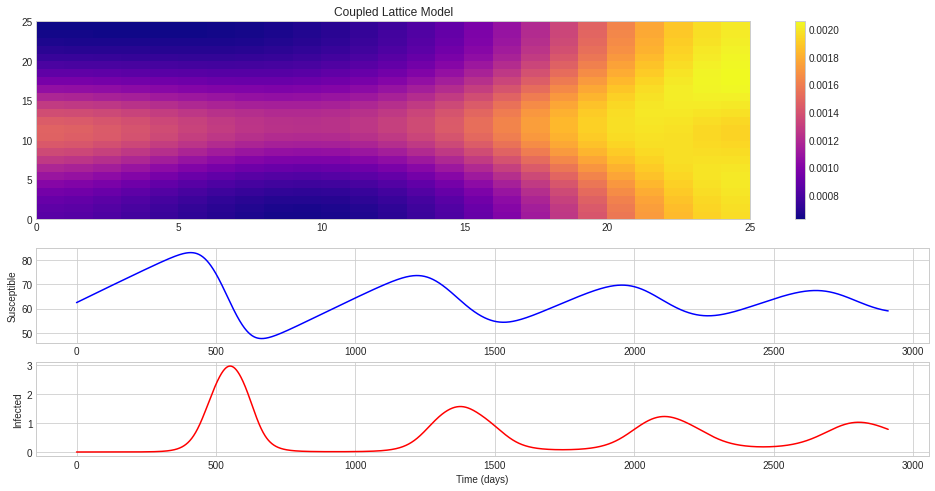

In [10]:
# Parameters
n=25;
beta=1.0;
gamma=0.1;
mu=0.0001;
rho=0.1;
X0=0.1;
nI=4;
N0=1.0;
nu=mu
timestep=1.;
ND=MaxTime=2910;
C=np.arange(0.0, 1.0, 0.001)
X=X0*np.ones((n,n)); Y=np.zeros(n*n);
ind=(np.ceil(n*n*np.random.uniform(size=nI))).astype(int)

for i in range(len(ind)):
    Y[ind[(i)]]=0.001*X0;

INPUT1=np.hstack((X0*np.ones((n*n)),Y))

Y3=Y
Y=np.reshape(Y, ((n,n)))
Y2=Y

INPUT3=np.hstack((X,Y));

INPUT2=np.reshape(INPUT3, ((2*n*n,1)))

for i in range(len(INPUT1)):
    INPUT1[i]=INPUT2[i]

INPUT=INPUT1
ndem=np.zeros((n,n))
Size=n
N=N0
### Note the size loop
for i in range(Size):
    for j in range(Size):
        ndem[i][j]=(1-4*rho)*N
        if i>0 : ndem[i][j] += rho*N
        if i<(Size-1) : ndem[i][j] += rho*N
        if j>0 : ndem[i][j] += rho*N
        if j<(Size-1) : ndem[i][j] += rho*N

# Model Definition
def diff_eqs(INP,t):
    V=INP
    Y=np.zeros(2*n*n)

    ### internal dynamics
    for i in range(Size):
        for j in range(Size):
            ss=i+j*Size*2
            ii=Size+i+j*Size*2
            Y[ss]=nu - beta*(1-4*rho)*V[ss]*V[ii]/ndem[i][j] - mu * V[ss]
            Y[ii]=beta*(1-4*rho)*V[ss]*V[ii]/ndem[i][j] - (gamma + mu) * V[ii]

            ### Interactions with four neighbours
            if i>0:
                FoI = beta*V[ss]*rho*V[ii-1]/ndem[i][j]
                Y[ss]-=FoI
                Y[ii]+=FoI

            if i<(Size-1):
                FoI = beta*V[ss]*rho*V[ii+1]/ndem[i][j]
                Y[ss]-=FoI
                Y[ii]+=FoI

            if j>0:
                FoI = beta*V[ss]*rho*V[ii-Size*2]/ndem[i][j]
                Y[ss]-=FoI
                Y[ii]+=FoI

            if j<(Size-1):
                FoI = beta*V[ss]*rho*V[ii+Size*2]/ndem[i][j]
                Y[ss]-=FoI
                Y[ii]+=FoI

    return Y


ola=np.zeros((n*n), dtype=np.integer)
for i in range(Size):
    for j in range(Size):
        ola[i*n+j]=i*Size*2+j

ola1=ola+n
tcS=[(n*n*X0)]
tcI=[sum(Y3[range(n*n)])]
tc22=np.zeros((n,n))

for k in tqdm(range(ND)):
    t_range = np.arange(2.0)
    RES = spi.odeint(diff_eqs,INPUT,t_range)
    INPUT=RES[-1]

    tcS.append(sum(RES[-1][ola]))
    tcI.append(sum(RES[-1][ola1]))

tc22=np.reshape(RES[-1][ola1], (n,n))
pl.figure(figsize=(16, 8))
pl.subplot(211)
pl.pcolor(tc22, cmap=pl.cm.plasma)
pl.title('Coupled Lattice Model')
pl.colorbar()

pl.subplot(413)
pl.plot(tcS, color='b')
pl.ylabel('Susceptible')

pl.subplot(414)
pl.plot(tcI, color='r')
pl.ylabel('Infected')
pl.xlabel('Time (days)')

In [11]:
Video("../Python_3_Scripts/Chapter7/Program_7_3/movie/movie.mp4", embed=True, width =800)

## Program 7.4: Forest fire model

0it [00:00, ?it/s]

/tmp/ipykernel_3914/3390431077.py:92: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.pcolor(Grid, cmap=pl.cm.jet)


Text(0.5, 0, 'Time (days)')

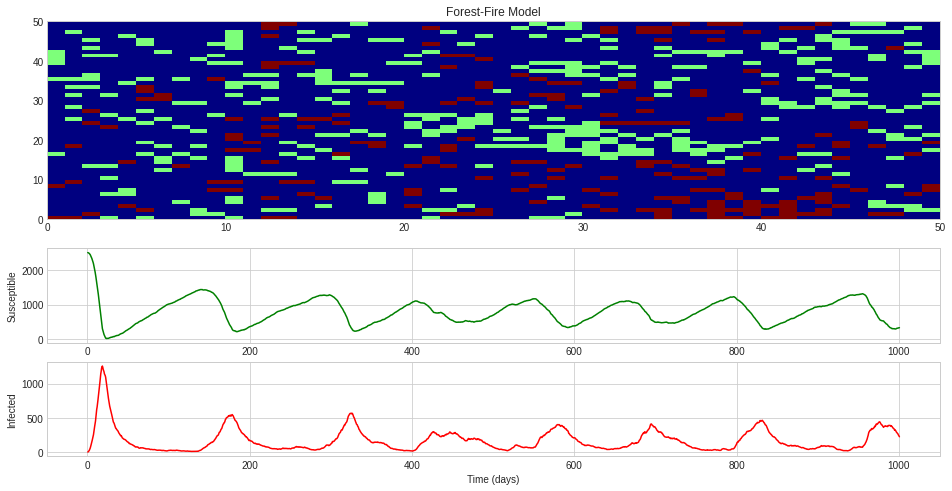

In [12]:
#!/usr/bin/env python3

####################################################################
###    This is the PYTHON version of program 7.4 from page 260 of  #
### "Modeling Infectious Disease in humans and animals"            #
### by Keeling & Rohani.										   #
###																   #
### It is the forest-fire model on a grid of size NxN.             #
### A zero time-step means that asynchronous updating is used.     #
####################################################################

###################################
### Written by Ilias Soumpasis    #
### ilias.soumpasis@gmail.com	  #
###################################

# Environment Preparation
import scipy.integrate as spi
import numpy as np
import pylab as pl
import time, os

### Select if you want to make a video (faster way)
#video=1
### or just0in-time plotting
video=0
t = time.time()

# Parameters
N=50;
tau=1.0;
gamma=0.1;
nu=0.01;
epsilon=1e-4;
timestep=0.5;
ND=MaxTime=1000;

Grid=2*np.ones((N,N), dtype=np.integer);
Grid[int(np.ceil((N-1)*np.random.uniform(size=1))[0]), int(np.ceil((N-1)*np.random.uniform(size=1))[0])]=3;
t=0; i=1; T=[]; X=[]; Y=[];

# Model Definition
def diff_eqs(INP,t):
    INF=np.zeros((N,N))
    SUS=np.zeros((N,N))
    EMP=np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            if INP[i][j]==1: EMP[i][j]=1
            if INP[i][j]==2: SUS[i][j]=1
            if INP[i][j]==3: INF[i][j]=1

    Infecteds=INF;  Susceptibles=SUS;
    X.append(sum(sum(Susceptibles))); Y.append(sum(sum(Infecteds))); # T[i]=t;

    Inf_Nbrs=Infecteds[:,np.hstack((np.arange(1,N),0))] + \
Infecteds[np.hstack((np.arange(1,N),0)),:] + \
Infecteds[:,np.hstack((49,np.arange(49)))] + \
Infecteds[np.hstack((49,np.arange(49))),:]

    if(timestep==0):  # asynchronous updating
        Rates=nu*EMP + gamma*Infecteds + tau*Susceptibles*(Inf_Nbrs + epsilon);
        vectorRates=np.reshape(Rates,N*N);
        Total_Rates=sum(vectorRates);
        Cum_Rates=np.cumsum(vectorRates);
        step=-np.log(np.random.uniform(size=(N,N)))/Total_Rates;
        R=rand(1,1)*Total_Rates;
        Event=min(pl.find(R<Cum_Rates));
        S[Event]=np.mod(S[Event],3)+1;
    else:
        Rates=nu*EMP + gamma*Infecteds + tau*Susceptibles*(Inf_Nbrs + epsilon);
        R=timestep*Rates-np.random.uniform(size=(N,N));
        S=np.mod(Grid-1+np.ceil(R),3)+1;
        step=timestep;

    return S, X, Y, timestep

k=0

def generator():
    while t <= ND:
        yield()
        
for _ in tqdm(generator()):
    [Grid, X, Y, timestep] = diff_eqs(Grid,timestep)
    t+=timestep
    T.append(t)
    k+=1

pl.figure(figsize=(16, 8))
pl.subplot(211)
pl.pcolor(Grid, cmap=pl.cm.jet)
pl.title('Forest-Fire Model')

pl.subplot(413)
pl.plot(T,X, color='g')
pl.ylabel('Susceptible')

pl.subplot(414)
pl.plot(T,Y, color='r')
pl.ylabel('Infected')
pl.xlabel('Time (days)')

In [13]:
Video("../Python_3_Scripts/Chapter7/Program_7_4/movie/movie.mp4", embed=True, width =1000)

## Program 7.8: Pairwise SIS approximation model

Text(0.5, 0, 'Time (Years)')

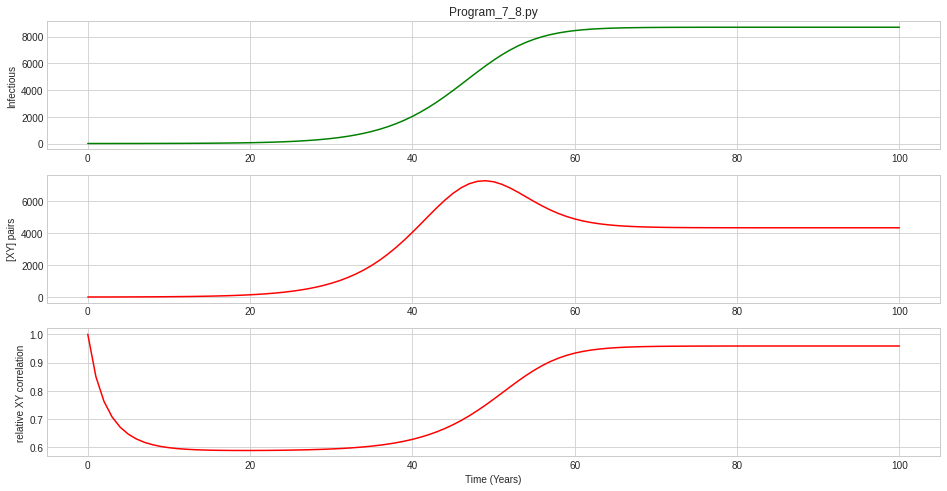

In [14]:
# Parameters
n=4;
tau=0.1;
gamma=0.05;
Y0=1.0;
N0=10000;
ND=MaxTime=100.0;
TS=1.0
X0=N0-Y0
XY0=n*Y0*X0/N0;

INPUT=np.hstack((X0,XY0))

# Model Definition
def diff_eqs(INP,t):
	'''The main set of equations'''
	Y=np.zeros((2))
	V = INP
	Y[0] = gamma*(N0-V[0]) - tau*V[1];
	Y[1] = tau*(n-1)*(n*V[0]-V[1])*V[1]/(n*V[0]) + gamma*(n*N0-n*V[0]-V[1]) - tau*V[1]\
	- tau*(n-1)*V[1]*V[1]/(n*V[0]) - gamma*V[1];
	return Y   # For odeint

# Model Run
t_start = 0.0; t_end = ND; t_inc = TS
t_range = np.arange(t_start, t_end+t_inc, t_inc)
RES = spi.odeint(diff_eqs,INPUT,t_range)
X = RES[:,0]
XY= RES[:,1]
Y=N0-X

# print (XY/(n*X*Y/N0))

#Ploting
pl.figure(figsize=(16, 8))
pl.subplot(311)
pl.plot(Y, '-g')
pl.ylabel('Infectious')
pl.title("Program_7_8.py")
pl.subplot(312)
pl.plot(XY, '-r')
pl.ylabel('[XY] pairs')
pl.subplot(313)
pl.plot(XY/((n*X)*(Y/N0)), '-r')
pl.ylabel('relative XY correlation')
pl.xlabel('Time (Years)')